In [2]:
import os
import pandas as pd
import numpy as np
import pickle 
import geopandas as gpd 

import matplotlib.pyplot as plt
import plotly.express as px

from scipy.stats.mstats import winsorize
#from shapely import wkt
import contextily as ctx
from shapely.wkt import loads as wkt_loads

In [3]:
income=pd.read_csv('data/income_2021.csv')
income.head()

,ZIP,Households,"Households Less Than $10,000","Households $10,000 to $14,999","Households $15,000 to $24,999","Households $25,000 to $34,999","Households $35,000 to $49,999","Households $50,000 to $74,999","Households $75,000 to $99,999","Households $100,000 to $149,999",...,"Nonfamily Households $50,000 to $74,999","Nonfamily Households $75,000 to $99,999","Nonfamily Households $100,000 to $149,999","Nonfamily Households $150,000 to $199,999","Nonfamily Households $200,000 or More",Nonfamily Households Median Income (Dollars),Nonfamily Households Mean Income (Dollars),Nonfamily Households Nonfamily Income in the Past 12 Months,Year,store_presence
0,601,5397.0,33.2,15.7,23.9,13.4,8.7,3.5,0.7,0.9,...,0.3,0.9,0.0,0.0,0.0,9386.0,13044.0,15.0,2021,0
1,602,12858.0,27.1,12.7,20.5,14.3,10.9,8.2,3.3,2.0,...,3.2,1.8,0.0,0.0,0.0,11242.0,16419.0,20.1,2021,0
2,603,19295.0,32.1,13.4,17.2,9.9,9.3,10.2,4.1,2.5,...,4.7,1.1,0.5,0.6,0.2,10639.0,16824.0,34.9,2021,0
3,606,1968.0,28.4,13.3,23.3,15.4,11.0,7.7,0.7,0.3,...,3.0,0.0,0.0,0.0,0.0,15849.0,16312.0,13.0,2021,0
4,610,8934.0,20.5,13.2,23.3,15.7,11.5,9.8,3.4,1.7,...,3.0,0.0,0.0,0.0,0.0,12832.0,16756.0,14.5,2021,0


In [4]:
# rename zip column 
income = income.rename(columns={'ZIP':'zip_code'})

In [5]:
# load the model
model_path = os.path.join('models', 'model.pkl')
# Load the model from a file
with open(model_path, 'rb') as file:
    predictive_model = pickle.load(file)

In [6]:
predictive_model.get_params()

{'iterations': 100, 'learning_rate': 0.1, 'depth': 4, 'verbose': 0}

In [7]:
zip_codes_to_recommend=income.copy()

In [8]:
zip_codes_to_recommend["store_presence"].value_counts()

store_presence
0    25689
1      556
Name: count, dtype: int64

In [9]:
# Get probabilities for each class
probabilities = predictive_model.predict_proba(
    zip_codes_to_recommend[[_ for _ in zip_codes_to_recommend.columns if _ in predictive_model.feature_names_]]
)

# Set custom threshold 
threshold = 0.5

# Apply threshold to the probabilities for the positive class
predictions = (probabilities[:, 1] >= threshold).astype(int)
pd.Series(predictions).value_counts()

0    25218
1     1027
Name: count, dtype: int64

If the probability of store presence (the second probability) is greater than or equal to 0.5, the model predicts that a store will be present in that zip code. Conversely, if this probability is less than 0.5, the model predicts no store presence. This allows to convert the probabilistic output of the model into binary class predictions. 

In [10]:
pd.Series(probabilities[:, 1]).describe()

count    26245.000000
mean         0.060654
std          0.153539
min          0.000054
25%          0.000436
50%          0.001576
75%          0.025276
max          0.958659
dtype: float64

In [11]:
# Create a list that contains the probabilities of the positive class (store presence) for each zip code
probs=[_[1] for _ in probabilities]

In [18]:
zip_codes_with_score = income.copy()
# add a column to the DataFrame containing the probabilities of store presence rounded to four decimal places
zip_codes_with_score["prob"] = pd.Series(probs).round(4)
zip_codes_with_score.head()

,zip_code,Households,"Households Less Than $10,000","Households $10,000 to $14,999","Households $15,000 to $24,999","Households $25,000 to $34,999","Households $35,000 to $49,999","Households $50,000 to $74,999","Households $75,000 to $99,999","Households $100,000 to $149,999",...,"Nonfamily Households $75,000 to $99,999","Nonfamily Households $100,000 to $149,999","Nonfamily Households $150,000 to $199,999","Nonfamily Households $200,000 or More",Nonfamily Households Median Income (Dollars),Nonfamily Households Mean Income (Dollars),Nonfamily Households Nonfamily Income in the Past 12 Months,Year,store_presence,prob
0,601,5397.0,33.2,15.7,23.9,13.4,8.7,3.5,0.7,0.9,...,0.9,0.0,0.0,0.0,9386.0,13044.0,15.0,2021,0,0.0021
1,602,12858.0,27.1,12.7,20.5,14.3,10.9,8.2,3.3,2.0,...,1.8,0.0,0.0,0.0,11242.0,16419.0,20.1,2021,0,0.0220
2,603,19295.0,32.1,13.4,17.2,9.9,9.3,10.2,4.1,2.5,...,1.1,0.5,0.6,0.2,10639.0,16824.0,34.9,2021,0,0.0676
3,606,1968.0,28.4,13.3,23.3,15.4,11.0,7.7,0.7,0.3,...,0.0,0.0,0.0,0.0,15849.0,16312.0,13.0,2021,0,0.0003
4,610,8934.0,20.5,13.2,23.3,15.7,11.5,9.8,3.4,1.7,...,0.0,0.0,0.0,0.0,12832.0,16756.0,14.5,2021,0,0.0034


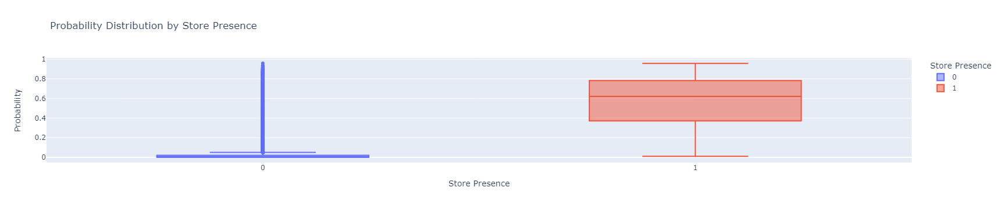

In [13]:
fig = px.box(zip_codes_with_score, x='store_presence', y='prob', color='store_presence',
             labels={
                     "store_presence": "Store Presence",
                     "prob": "Probability"
                    },
             title="Probability Distribution by Store Presence")

fig.show()


In [14]:
zip_codes_per_state=pd.read_csv("data/zip_codes_per_state.csv")
zip_codes_per_state.head()

,zip_code,state_name,state_code,geometry
0,43451,Ohio,OH,"POLYGON ((-83.708733 41.327326, -83.708147 41...."
1,43452,Ohio,OH,"POLYGON ((-83.086978 41.537796, -83.082563 41...."
2,43456,Ohio,OH,"MULTIPOLYGON (((-82.835577 41.710823, -82.8351..."
3,43457,Ohio,OH,POLYGON ((-83.49650299999999 41.25370799999999...
4,43458,Ohio,OH,"POLYGON ((-83.222292 41.531025, -83.2222819999..."


In [15]:
# Calculate the intersection of zipcodes from both DataFrames
Z=[__ for __ in zip_codes_per_state["zip_code"].astype(str)]
z3=[_ in Z  for _ in zip_codes_with_score["zip_code"].astype(str)]
np.mean(z3)

0.9923413983615926

In [16]:
# rank according to the probabilities for the zip codes without stores

df2=zip_codes_with_score.copy()
df2=df2[df2["store_presence"]==0]
df2.sort_values("prob", ascending=False)

,zip_code,Households,"Households Less Than $10,000","Households $10,000 to $14,999","Households $15,000 to $24,999","Households $25,000 to $34,999","Households $35,000 to $49,999","Households $50,000 to $74,999","Households $75,000 to $99,999","Households $100,000 to $149,999",...,"Nonfamily Households $75,000 to $99,999","Nonfamily Households $100,000 to $149,999","Nonfamily Households $150,000 to $199,999","Nonfamily Households $200,000 or More",Nonfamily Households Median Income (Dollars),Nonfamily Households Mean Income (Dollars),Nonfamily Households Nonfamily Income in the Past 12 Months,Year,store_presence,prob
24846,95051,22468.0,2.3,1.2,2.0,3.3,3.0,8.7,7.5,17.4,...,6.9,16.4,16.2,24.9,122488.0,155756.0,23.8,2021,0,0.9587
21476,77024,15846.0,3.8,1.5,5.3,3.7,6.2,11.0,10.8,15.2,...,16.9,14.0,5.1,11.0,71686.0,91141.0,35.2,2021,0,0.9391
2227,10028,24790.0,3.2,1.6,3.6,3.2,4.0,8.8,9.1,16.5,...,12.3,19.6,12.9,18.8,105027.0,151126.0,32.9,2021,0,0.9320
23883,90049,16116.0,4.5,1.1,3.7,3.4,5.2,9.2,8.2,16.9,...,9.8,21.1,11.9,18.5,102979.0,149263.0,38.2,2021,0,0.9288
24877,95134,13383.0,3.5,1.6,1.9,1.7,3.3,3.6,6.0,21.0,...,7.3,22.2,14.7,35.2,149750.0,168214.0,26.9,2021,0,0.9191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25794,98350,92.0,13.0,6.5,16.3,19.6,13.0,12.0,12.0,3.3,...,15.4,0.0,0.0,0.0,21250.0,33477.0,34.6,2021,0,0.0001
4538,17862,135.0,7.4,0.0,10.4,26.7,24.4,12.6,18.5,0.0,...,0.0,0.0,0.0,0.0,45385.0,42545.0,13.6,2021,0,0.0001
7289,29593,810.0,12.0,5.2,30.1,10.0,11.7,15.9,8.4,5.2,...,6.3,0.0,0.0,0.0,17174.0,22098.0,40.8,2021,0,0.0001
20668,74560,179.0,8.9,4.5,17.9,12.3,10.1,19.0,13.4,9.5,...,0.0,5.1,0.0,0.0,16406.0,25421.0,43.6,2021,0,0.0001


In [17]:
#
# how to display the results for the recommendation system
#

In [18]:
# Perform the left join on the zip_code column
zip_codes_with_scores_and_states = pd.merge(zip_codes_with_score, zip_codes_per_state, on='zip_code', how='left')

# Check the proportion of missing values in the state_name column
missing_state_name_proportion = zip_codes_with_scores_and_states["state_name"].isna().mean()
missing_state_name_proportion

0.006858897799010407

In [19]:
zip_codes_with_scores_and_states = zip_codes_with_scores_and_states.dropna()

In [24]:
# recommender system per state

def rank_zip_codes(dataframe):
    """
    Ranks zip codes from the input dataframe based on the 'prob' column,
    considering only zip codes where 'store_presence' is 0. 
    """
    # Check for the necessary columns in the dataframe
    required_columns = ['store_presence', 'prob']
    missing_columns = [col for col in required_columns if col not in dataframe.columns]
    if missing_columns:
        raise ValueError(f"Missing columns in the dataframe: {', '.join(missing_columns)}")

    # Copy the dataframe to avoid modifying the original
    df_filtered = dataframe.copy()

    # Filter the dataframe where 'store_presence' is 0
    df_filtered = df_filtered[df_filtered['store_presence'] == 0]

    # Sort the dataframe by 'prob' in descending order
    df_filtered = df_filtered.sort_values('prob', ascending=False)

    return df_filtered
    
#

def rank_zipcodes_per_state(
        state_name,
        zip_codes_per_state=zip_codes_per_state, 
        zip_codes_with_score=zip_codes_with_score
    ):
    """
    Filters zip codes by state, joins them with another dataframe that includes scores,
    and ranks the zip codes based on the 'prob' column where 'store_presence' is 0.
    If the state name is not found in the provided data, it exits with a ValueError.

    Parameters:
    - state_name (str): The name of the state to filter zip codes.
    - zip_codes_per_state (pd.DataFrame): A dataframe containing zip codes and their corresponding states.
    - zip_codes_with_score (pd.DataFrame): A dataframe containing zip codes, 'prob' values, and 'store_presence' status.

    Returns:
    - pd.DataFrame: A dataframe sorted by 'prob' in descending order,
                    including only entries with 'store_presence' == 0, for the specified state.

    Raises:
    - ValueError: If the specified state is not found in the zip_codes_per_state dataframe.
    """
    # Check if the state name is valid
    if state_name not in zip_codes_per_state['state_name'].unique():
        raise ValueError(f"Invalid state name: {state_name}. Please provide a valid state name.")

    # Filter the zip codes for the specified state
    filtered_state_zip_codes = zip_codes_per_state[zip_codes_per_state['state_name'] == state_name]

    # Perform a left join on the zip code column
    joined_data = filtered_state_zip_codes.merge(zip_codes_with_score, on='zip_code', how='left')

    # Use the previously defined function to rank the zip codes
    ranked_zip_codes = rank_zip_codes(joined_data)

    return ranked_zip_codes


#


def plot_state_prob_choropleth(state_name, df=zip_codes_with_scores_and_states, top_n=3, highlight_store_presence=True):
    '''
    Create a choropleth map that visualizes the probability of opening a store within different zip codes of a specified state 
    and highlight the top 3.
    '''
    # Filter the DataFrame for the specified state and create a copy
    state_df = df[df["state_name"] == state_name].copy()

    if state_df.empty:
        print("No data available for the specified state.")
        return

    # Winsorize the 'prob' values at the 95th percentile to reduce the impact of outliers
    state_df['prob'] = winsorize(state_df['prob'], limits=[0, 0.05])
    
    # Convert WKT strings in the 'Geometry' column to geometric objects
    state_df['geometry'] = state_df['geometry'].apply(wkt_loads)
    
    # Convert the DataFrame to a GeoDataFrame
    gdf = gpd.GeoDataFrame(state_df, geometry='geometry', crs="EPSG:4326")
    
    # Project to Web Mercator
    gdf = gdf.to_crs(epsg=3857)
    
    # Sort the data by probability in descending order
    gdf = gdf.sort_values(by='prob', ascending=False)
    
    # Set up the figure and axis with optimized margins and larger figure size
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    fig.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)
    
    # Plot choropleth of the 'prob' column
    choropleth = gdf.plot(column='prob', ax=ax, alpha=0.85, edgecolor='black', cmap='viridis')
    
    # Create a colorbar
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf['prob'].min(), vmax=gdf['prob'].max()))
    sm._A = []  # Empty array for the data range
    cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.6, pad=0.01)
    cbar.set_label('Probability of Opening a Store')
    
    # Highlight the top N zip codes
    gdf.iloc[:top_n].plot(ax=ax, color='gold', edgecolor='red', linewidth=2)
    
    # Overlay zip codes with 'store_presence' == 1 in a different color
    if highlight_store_presence:
        gdf[gdf['store_presence'] == 1].plot(ax=ax, color='red', alpha=0.5)
    
    # Add title and configure axis
    ax.set_title(f'Choropleth Map for Probability of Opening a Store in {state_name}')
    ax.set_axis_off()
    
    # Add basemap using OpenStreetMap tiles
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    return fig

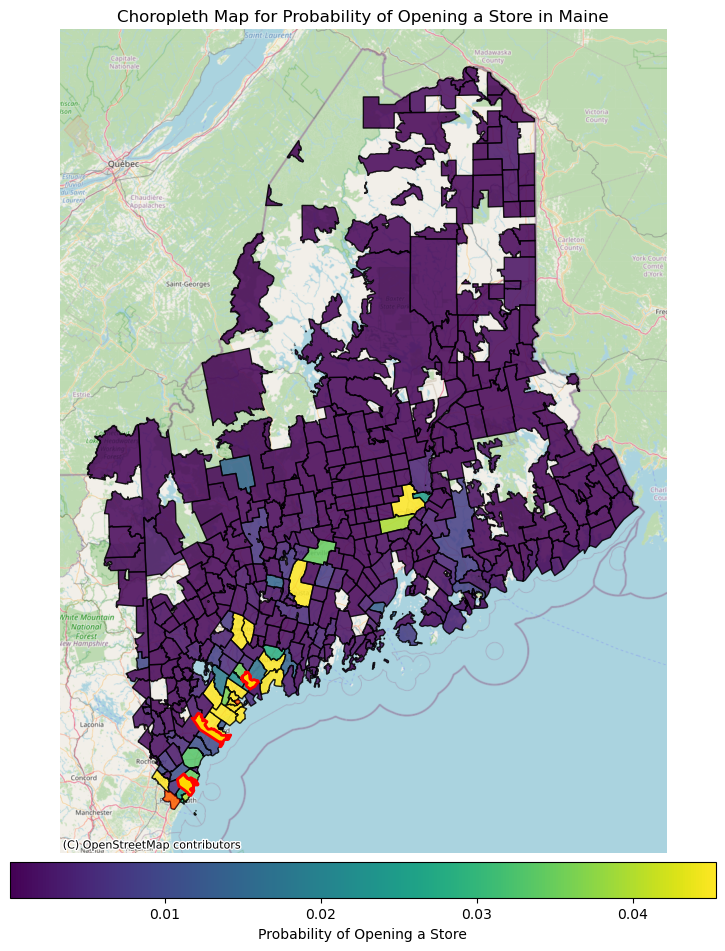

In [25]:
# Check function applicability 
fig = plot_state_prob_choropleth("Maine")

In [23]:
#
# apply the recommendation system on states without stores
#

In [68]:
df=zip_codes_with_scores_and_states

# Group by 'StateName' and sum the 'store_presence' column to count the total number of stores in each state
total_stores_per_state = df.groupby('state_name')['store_presence'].sum()

# Convert the Series to a DataFrame
total_stores_df = total_stores_per_state.reset_index()

# Rename the columns for clarity
total_stores_df.columns = ['state_name', 'total_stores']

# Sort the DataFrame by 'TotalStores' in increasing order
sorted_stores_df = total_stores_df.sort_values(by='total_stores')
sorted_stores_df 

,state_name,total_stores
50,Wyoming,0
1,Alaska,0
48,West Virginia,0
41,South Dakota,0
34,North Dakota,0
26,Montana,0
11,Hawaii,0
24,Mississippi,0
3,Arkansas,1
45,Vermont,1


In [69]:
without_store=sorted_stores_df[sorted_stores_df["total_stores"]==0]
without_store

,state_name,total_stores
50,Wyoming,0
1,Alaska,0
48,West Virginia,0
41,South Dakota,0
34,North Dakota,0
26,Montana,0
11,Hawaii,0
24,Mississippi,0


##### Apply the function to states without a store to identify future store locations, highlighting the top three.

C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



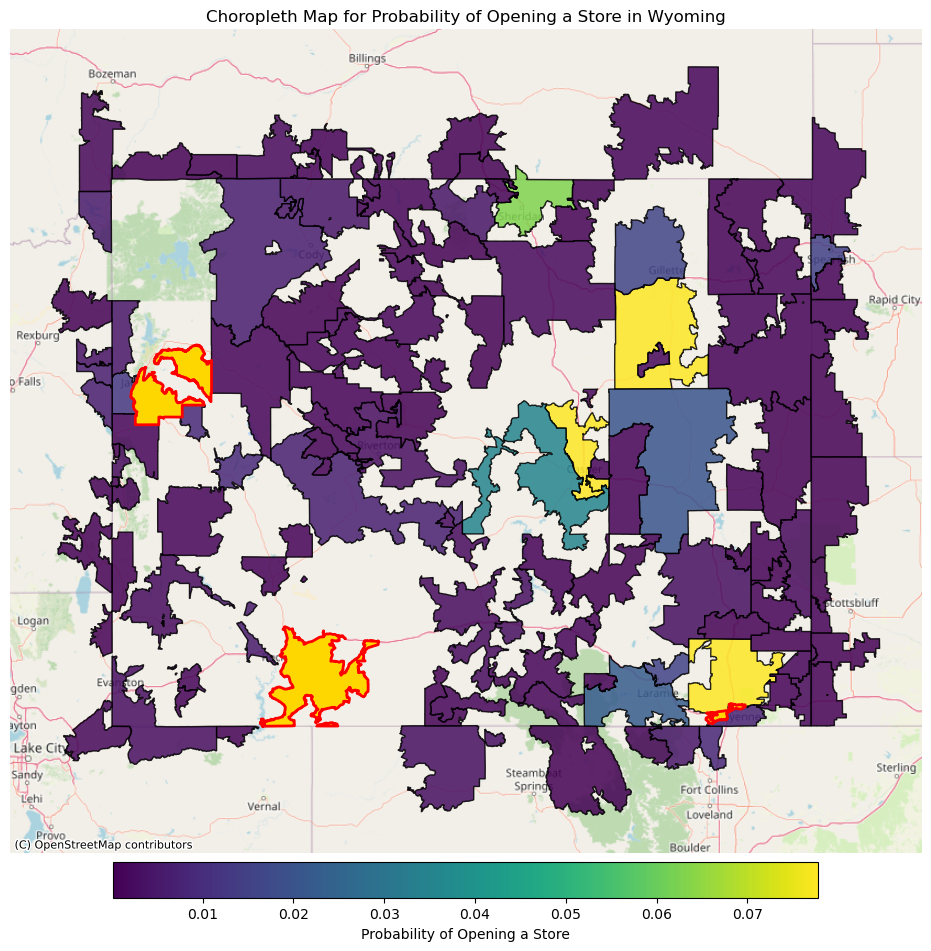

Figure(1200x1000)
Wyoming


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



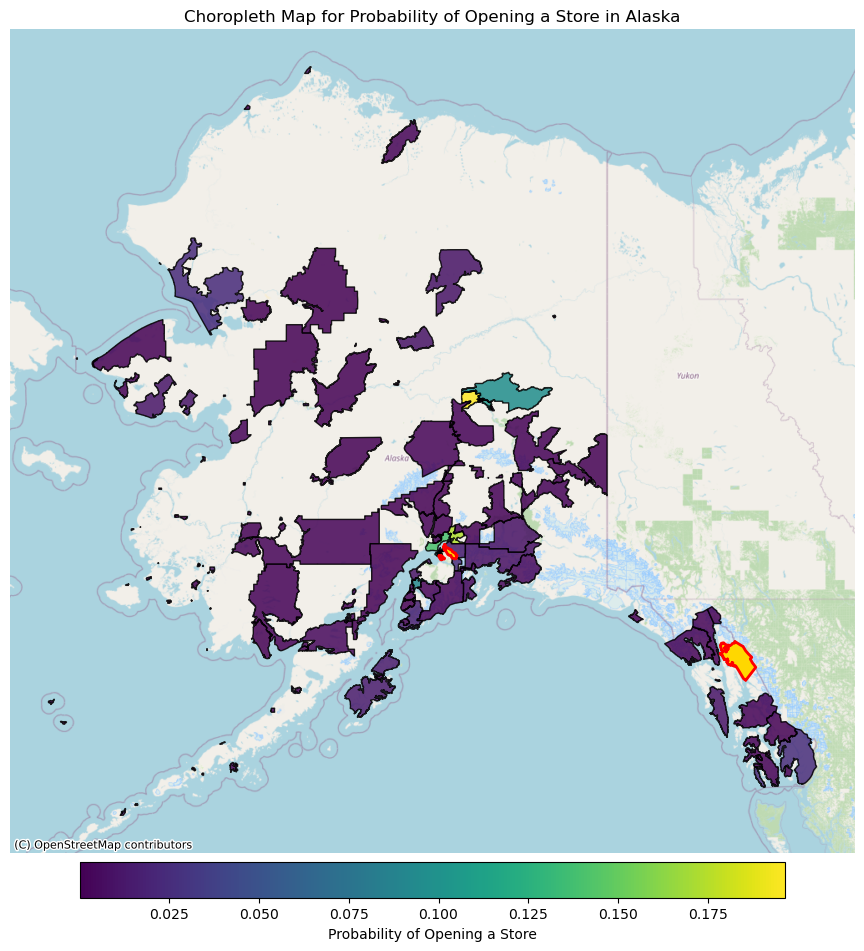

Figure(1200x1000)
Alaska


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



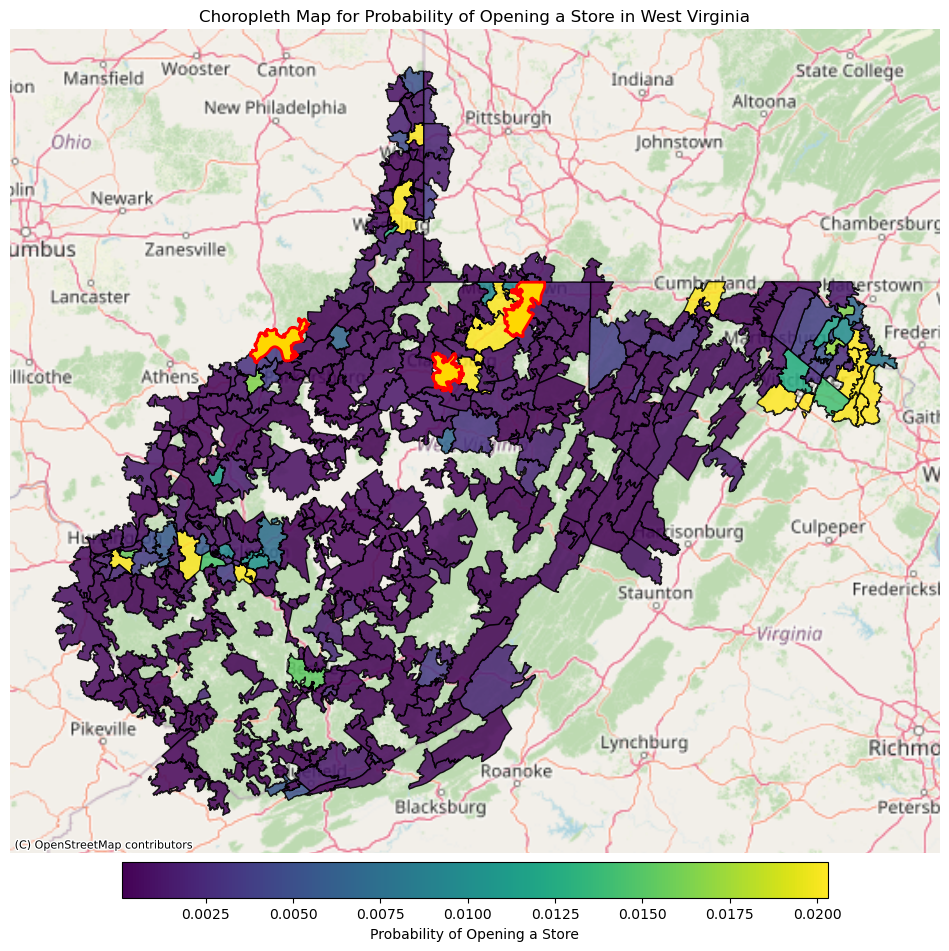

Figure(1200x1000)
West Virginia


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



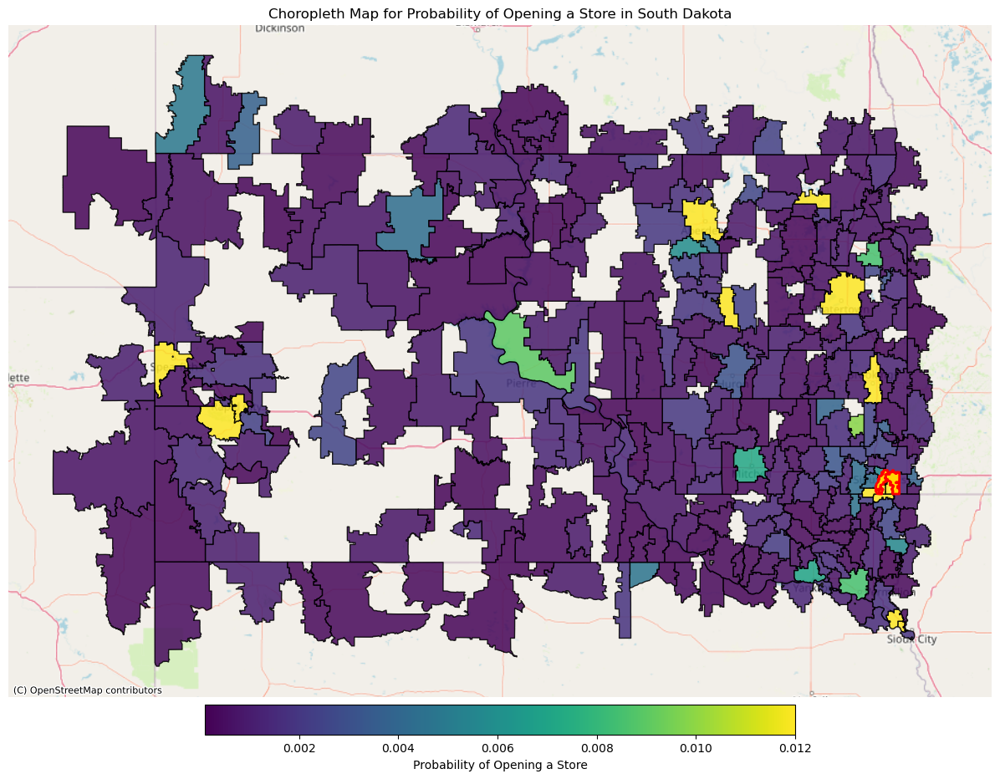

Figure(1200x1000)
South Dakota


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



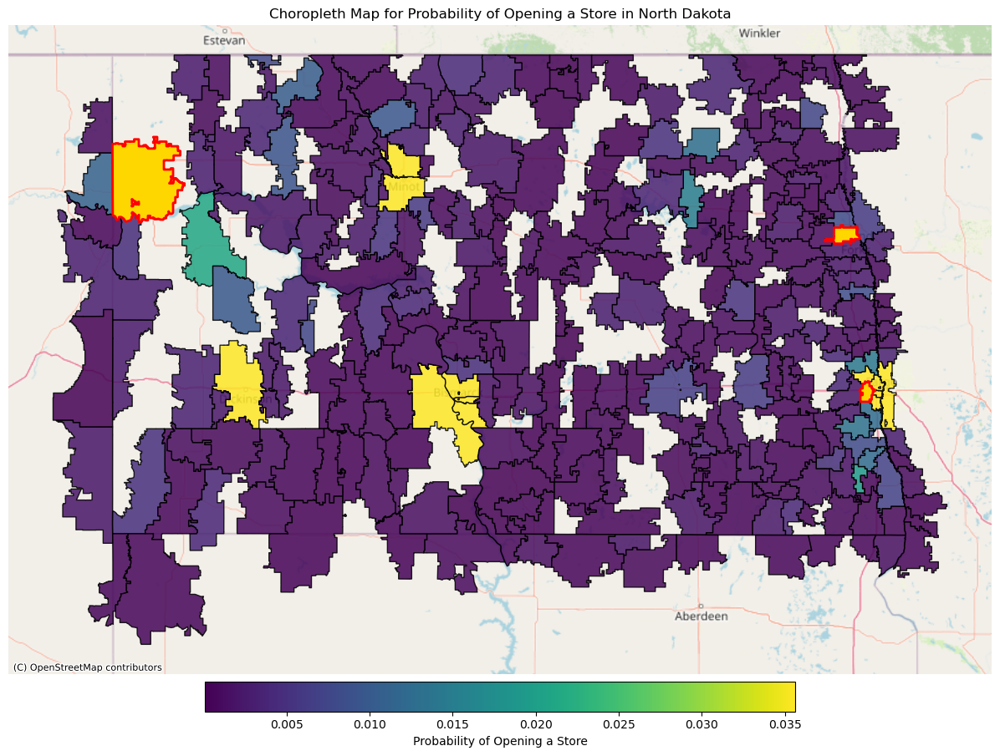

Figure(1200x1000)
North Dakota


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



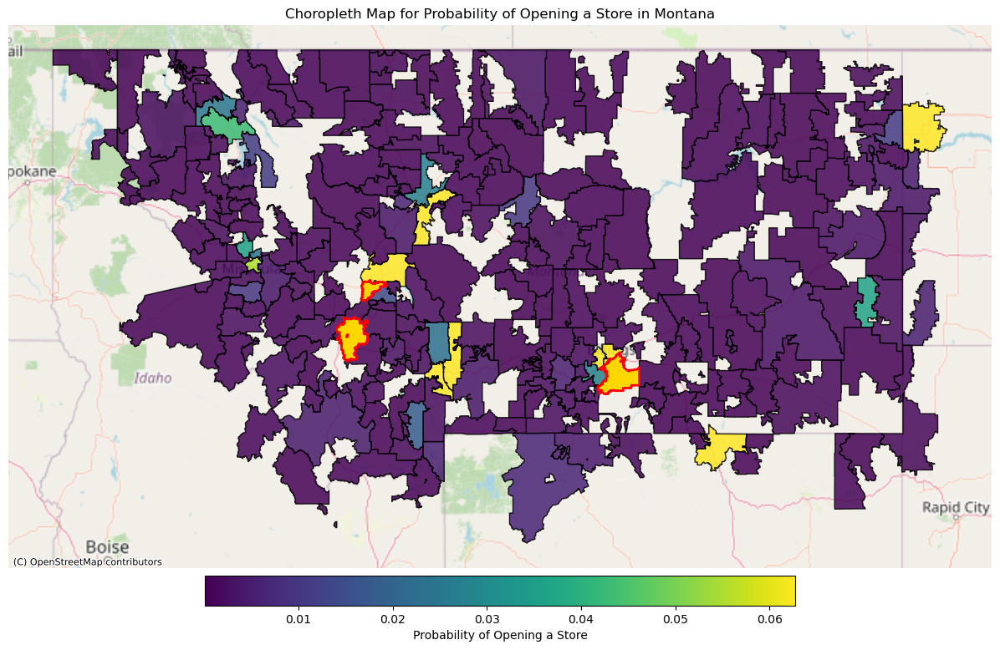

Figure(1200x1000)
Montana


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



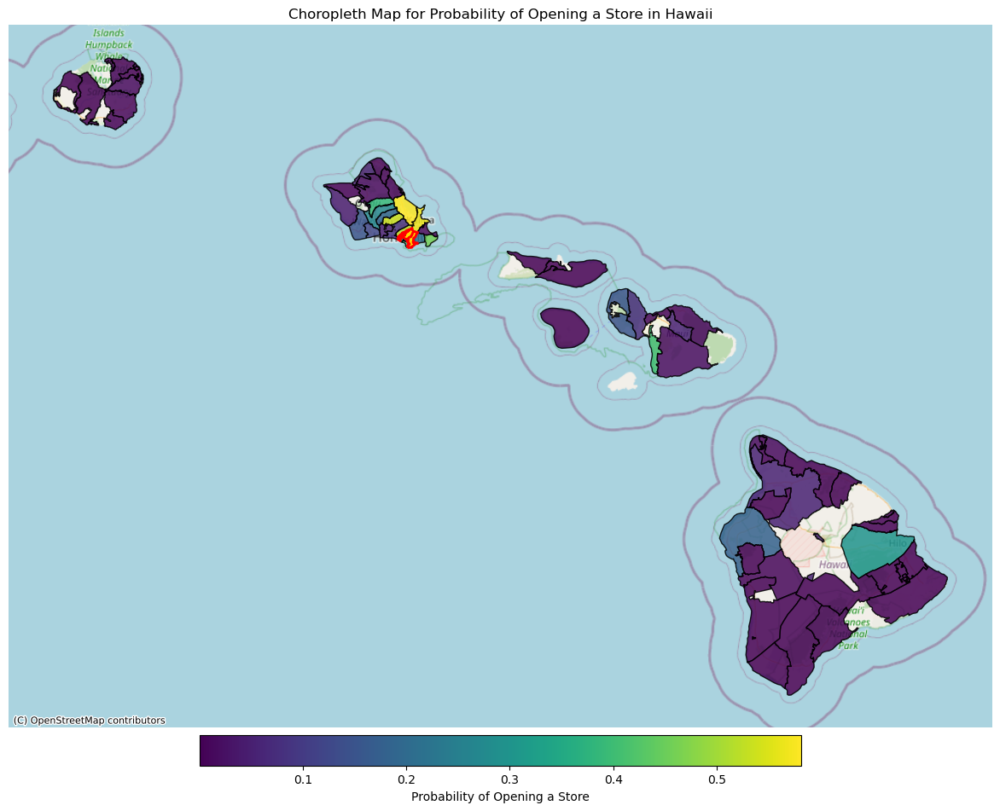

Figure(1200x1000)
Hawaii


C:\Users\carme\AppData\Local\Temp\ipykernel_3700\3638043018.py:110: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



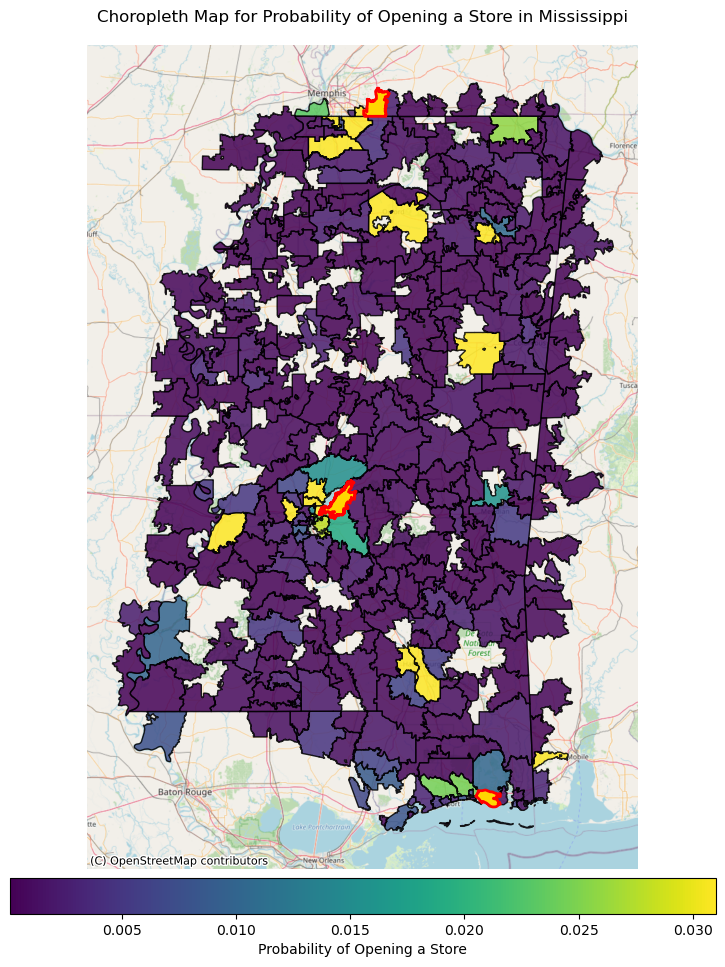

Figure(1200x1000)
Mississippi


In [70]:
# cycle to exports map with recommendation

# Make sure the maps directory exists
os.makedirs('maps', exist_ok=True)

for state in without_store["state_name"]:
    fig = plot_state_prob_choropleth(state)
    # Save the figure to the filesystem with the given filename
    fig.savefig(f'maps/{state}.png', dpi=300, bbox_inches='tight')
    print(fig)
    plt.close(fig)  # Close the figure after saving to free up memory
    print(state)